# Week 3 Day 1

Welcome to working with Diffusion Models and Text-to-Speech locally!

This notebook demonstrates:
- Stable Diffusion XL for text-to-image generation
- Text-to-speech synthesis
- Working with Hugging Face models

## Setup Requirements

1. Ensure you have a GPU with CUDA support (recommended for best performance)
2. Install required packages (see cells below)
3. Set up your Hugging Face token in a `.env` file (see instructions below)

## Local Development Tips

1. Check your GPU availability using the GPU check cells
2. Install packages as needed - they will persist in your local environment
3. Use a `.env` file in the project root to store your `HF_TOKEN` securely
4. If you encounter memory issues, restart the kernel or reduce batch sizes

In [ ]:
# Install required packages (uncomment if needed)
# !pip install -q --upgrade transformers==4.56.2
# !uv pip install diffusers accelerate datasets soundfile python-dotenv

Using Python 3.12.12 environment at: /home/myong/projects/llm_engineering/.venv
Resolved 67 packages in 228ms                                        
⠙ Preparing packages... (0/1)                                                   
⠙ Preparing packages... (0/1)-------------------     0 B/1.25 MiB            
⠙ Preparing packages... (0/1)------------------- 16.00 KiB/1.25 MiB          
⠙ Preparing packages... (0/1)------------------- 32.00 KiB/1.25 MiB          
⠙ Preparing packages... (0/1)------------------- 48.00 KiB/1.25 MiB          
⠙ Preparing packages... (0/1)------------------- 64.00 KiB/1.25 MiB          
⠙ Preparing packages... (0/1)------------------- 80.00 KiB/1.25 MiB          
⠙ Preparing packages... (0/1)------------------- 96.00 KiB/1.25 MiB          
⠙ Preparing packages... (0/1)------------------- 112.00 KiB/1.25 MiB         
⠙ Preparing packages... (0/1)------------------- 128.00 KiB/1.25 MiB         
⠙ Preparing packages... (0/1)------------------- 144.00 KiB/1.25 Mi

In [3]:
# Let's check the GPU availability

gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)
  if 'NVIDIA' in gpu_info or 'CUDA' in gpu_info:
    print("Success - GPU detected")
  else:
    print("GPU status unclear - check output above")

Wed Dec  3 16:11:47 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.95.05              Driver Version: 580.95.05      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA RTX PRO 6000 Blac...    Off |   00000000:41:00.0 Off |                  Off |
| 30%   33C    P8              6W /  300W |    9718MiB /  97887MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

# Connecting Hugging Face

You'll need to log in to the HuggingFace hub if you've not done so before.

1. If you haven't already done so, create a **free** HuggingFace account at https://huggingface.co and navigate to Settings from the user menu on the top right. Then Create a new API token, giving yourself write permissions.  

**IMPORTANT** when you create your HuggingFace API key, please be sure to select WRITE permissions for your key by clicking on the WRITE tab, otherwise you may get problems later. Not "fine-grained" but "write".

2. Create a `.env` file in your project root directory with the following content:
   ```
   HF_TOKEN=hf_your_token_here
   ```

3. Execute the cell below to log in. The notebook will automatically load your token from the `.env` file.

In [3]:
from huggingface_hub import login
# from google.colab import userdata


# hf_token = userdata.get('HF_TOKEN')
import os
from dotenv import load_dotenv
load_dotenv()
hf_token = os.getenv('HF_TOKEN')
login(hf_token, add_to_git_credential=True)

Token has not been saved to git credential helper.
Note: Environment variable`HF_TOKEN` is set and is the current active token independently from the token you've just configured.


Cannot authenticate through git-credential as no helper is defined on your machine.
You might have to re-authenticate when pushing to the Hugging Face Hub.
Run the following command in your terminal in case you want to set the 'store' credential helper as default.

git config --global credential.helper store

Read https://git-scm.com/book/en/v2/Git-Tools-Credential-Storage for more details.


In [4]:
import accelerate

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

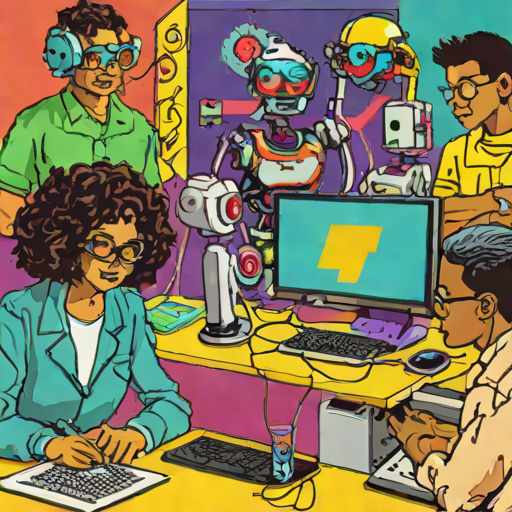

In [5]:
from IPython.display import display
from diffusers import AutoPipelineForText2Image
import torch

pipe = AutoPipelineForText2Image.from_pretrained("stabilityai/sdxl-turbo", torch_dtype=torch.float16, variant="fp16")
pipe.to("cuda")
prompt = "A class of students learning AI engineering in a vibrant pop-art style"
image = pipe(prompt=prompt, num_inference_steps=4, guidance_scale=0.0).images[0]
display(image)


In [2]:
# Optional: Restart the kernel if needed to free up memory
# Uncomment the lines below if you need to restart the kernel
# import IPython
# IPython.Application.instance().kernel.do_shutdown(True)

model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

text_encoder_2/model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

text_encoder/model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.fp16.safete(…):   0%|          | 0.00/5.14G [00:00<?, ?B/s]

vae_1_0/diffusion_pytorch_model.fp16.saf(…):   0%|          | 0.00/167M [00:00<?, ?B/s]

vae/diffusion_pytorch_model.fp16.safeten(…):   0%|          | 0.00/167M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


  0%|          | 0/30 [00:00<?, ?it/s]

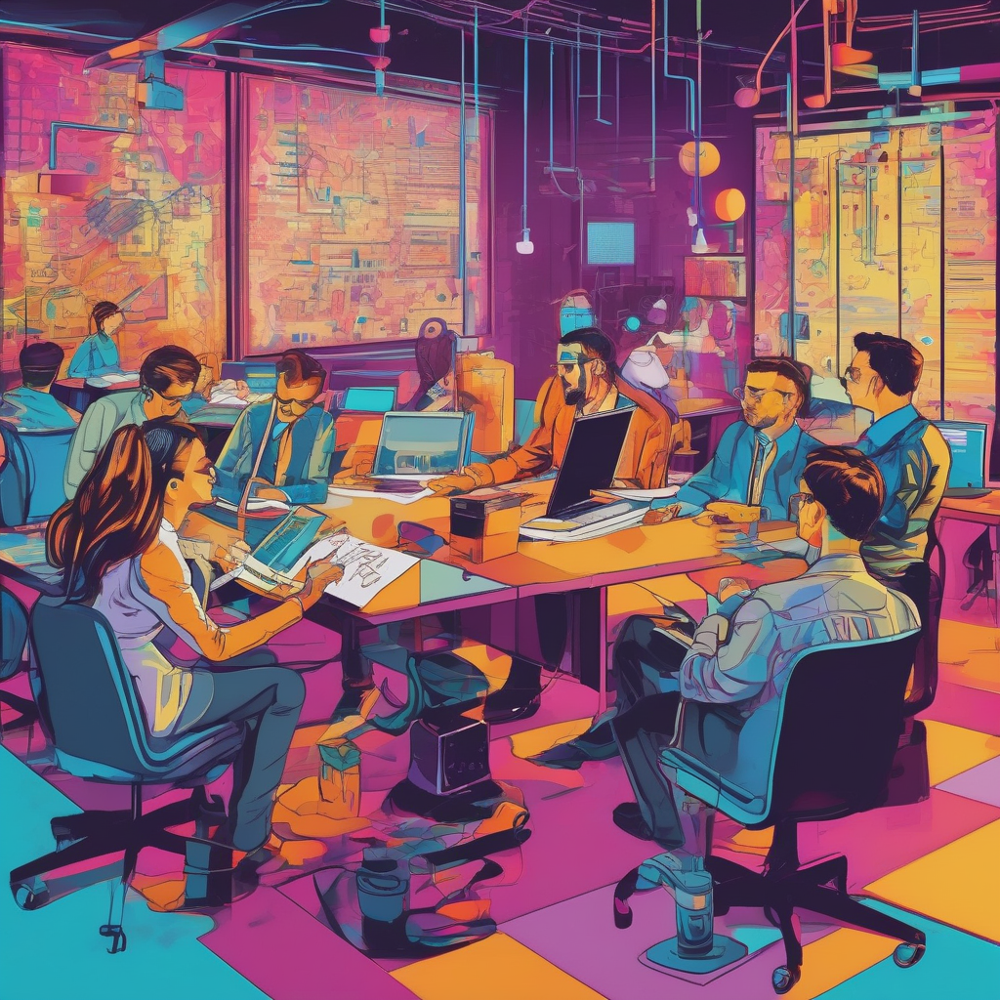

In [1]:
from IPython.display import display
from diffusers import DiffusionPipeline
import torch

pipe = DiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16, use_safetensors=True, variant="fp16")
pipe.to("cuda")

prompt = "A class of data scientists learning AI engineering in a vibrant high-energy pop-art style"

image = pipe(prompt=prompt, num_inference_steps=30).images[0]

display(image)


In [ ]:
# Optional: Restart the kernel if needed to free up memory
# Uncomment the lines below if you need to restart the kernel
# import IPython
# IPython.Application.instance().kernel.do_shutdown(True)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

model_index.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

Fetching 9 files:   0%|          | 0/9 [00:00<?, ?it/s]

unet/diffusion_pytorch_model.fp16.safete(…):   0%|          | 0.00/4.52G [00:00<?, ?B/s]

vae_1_0/diffusion_pytorch_model.fp16.saf(…):   0%|          | 0.00/167M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

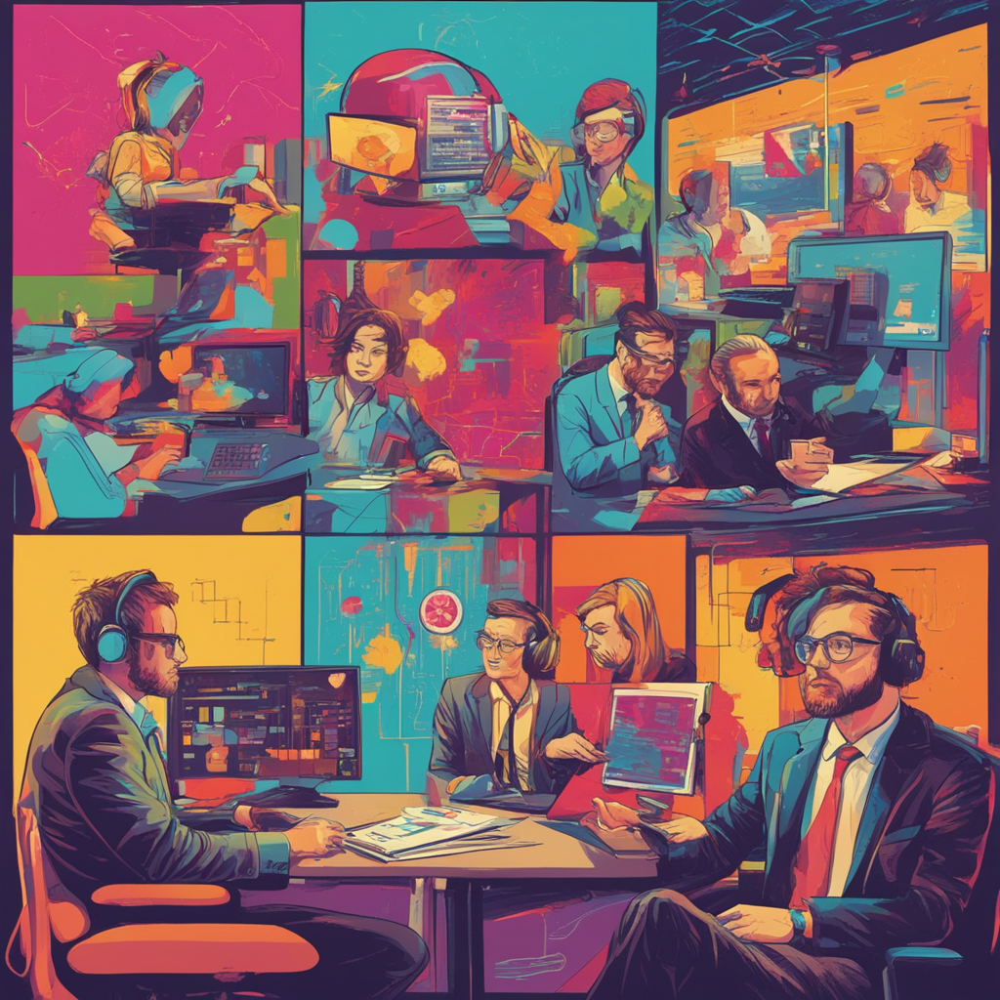

In [6]:
from diffusers import DiffusionPipeline
import torch

base = DiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16, variant="fp16", use_safetensors=True)
base.to("cuda")
refiner = DiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-xl-refiner-1.0", text_encoder_2=base.text_encoder_2, vae=base.vae, torch_dtype=torch.float16, use_safetensors=True, variant="fp16",)
refiner.to("cuda")

# Define how many steps and what % of steps to be run on each experts (80/20) here
n_steps = 40
high_noise_frac = 0.8

prompt = "A class of data scientists learning AI engineering in a vibrant high-energy pop-art style"

# run both experts
image = base(
    prompt=prompt,
    num_inference_steps=n_steps,
    denoising_end=high_noise_frac,
    output_type="latent",
).images

image = refiner(
    prompt=prompt,
    num_inference_steps=n_steps,
    denoising_start=high_noise_frac,
    image=image,
).images[0]

display(image)

In [ ]:
# Optional: Restart the kernel if needed to free up memory
# Uncomment the lines below if you need to restart the kernel
# import IPython
# IPython.Application.instance().kernel.do_shutdown(True)

{'status': 'ok', 'restart': True}

: 

In [ ]:
# !pip install --upgrade datasets==3.6.0

In [1]:
from transformers import pipeline
from datasets import load_dataset
import soundfile as sf
import torch
from IPython.display import Audio

synthesiser = pipeline("text-to-speech", "microsoft/speecht5_tts", device='cuda')
embeddings_dataset = load_dataset("matthijs/cmu-arctic-xvectors", split="validation", trust_remote_code=True)
speaker_embedding = torch.tensor(embeddings_dataset[7306]["xvector"]).unsqueeze(0)
speech = synthesiser("Hi to an artificial intelligence engineer, on the way to mastery!", forward_params={"speaker_embeddings": speaker_embedding})

Audio(speech["audio"], rate=speech["sampling_rate"])

spm_char.model:   0%|          | 0.00/238k [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/40.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/234 [00:00<?, ?B/s]

Device set to use cuda


config.json:   0%|          | 0.00/636 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/50.7M [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/50.6M [00:00<?, ?B/s]

cmu-arctic-xvectors.py: 0.00B [00:00, ?B/s]

spkrec-xvect.zip:   0%|          | 0.00/17.9M [00:00<?, ?B/s]

Generating validation split: 0 examples [00:00, ? examples/s]

In [ ]:
# Optional: Restart the kernel if needed to free up memory
# Uncomment the lines below if you need to restart the kernel
# import IPython
# IPython.Application.instance().kernel.do_shutdown(True)

## Advanced: FLUX Model (Requires Powerful GPU)

The following cells demonstrate the FLUX model, which requires significant GPU memory (typically 24GB+ VRAM).

**Note**: This may not work on all local GPUs. If you encounter out-of-memory errors, you may need:
- A GPU with at least 24GB VRAM (e.g., A100, RTX 3090/4090, or similar)
- Or use a cloud service with appropriate GPU resources

In [1]:
# Let's check the GPU - should have at least 24GB VRAM for FLUX

gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)
  if 'A100' in gpu_info:
    print("Success - Connected to an NVIDIA A100")
  elif 'RTX' in gpu_info or 'NVIDIA' in gpu_info:
    print("GPU detected - check VRAM above. FLUX requires ~24GB+ VRAM")
  else:
    print("GPU status unclear - check output above")

Wed Dec  3 16:32:54 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.95.05              Driver Version: 580.95.05      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA RTX PRO 6000 Blac...    Off |   00000000:41:00.0 Off |                  Off |
| 30%   34C    P8             12W /  300W |    9718MiB /  97887MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

model_index.json:   0%|          | 0.00/536 [00:00<?, ?B/s]

Fetching 23 files:   0%|          | 0/23 [00:00<?, ?it/s]

text_encoder_2/model-00002-of-00002.safe(…):   0%|          | 0.00/4.53G [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

text_encoder_2/model-00001-of-00002.safe(…):   0%|          | 0.00/4.99G [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/613 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/274 [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/19.9k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/782 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/588 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/705 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/2.54k [00:00<?, ?B/s]

tokenizer_2/spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.42M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/20.8k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/321 [00:00<?, ?B/s]

transformer/diffusion_pytorch_model-0000(…):   0%|          | 0.00/9.96G [00:00<?, ?B/s]

transformer/diffusion_pytorch_model-0000(…):   0%|          | 0.00/9.95G [00:00<?, ?B/s]

transformer/diffusion_pytorch_model-0000(…):   0%|          | 0.00/3.87G [00:00<?, ?B/s]

(…)ion_pytorch_model.safetensors.index.json:   0%|          | 0.00/121k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/774 [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/168M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

You set `add_prefix_space`. The tokenizer needs to be converted from the slow tokenizers


  0%|          | 0/4 [00:00<?, ?it/s]

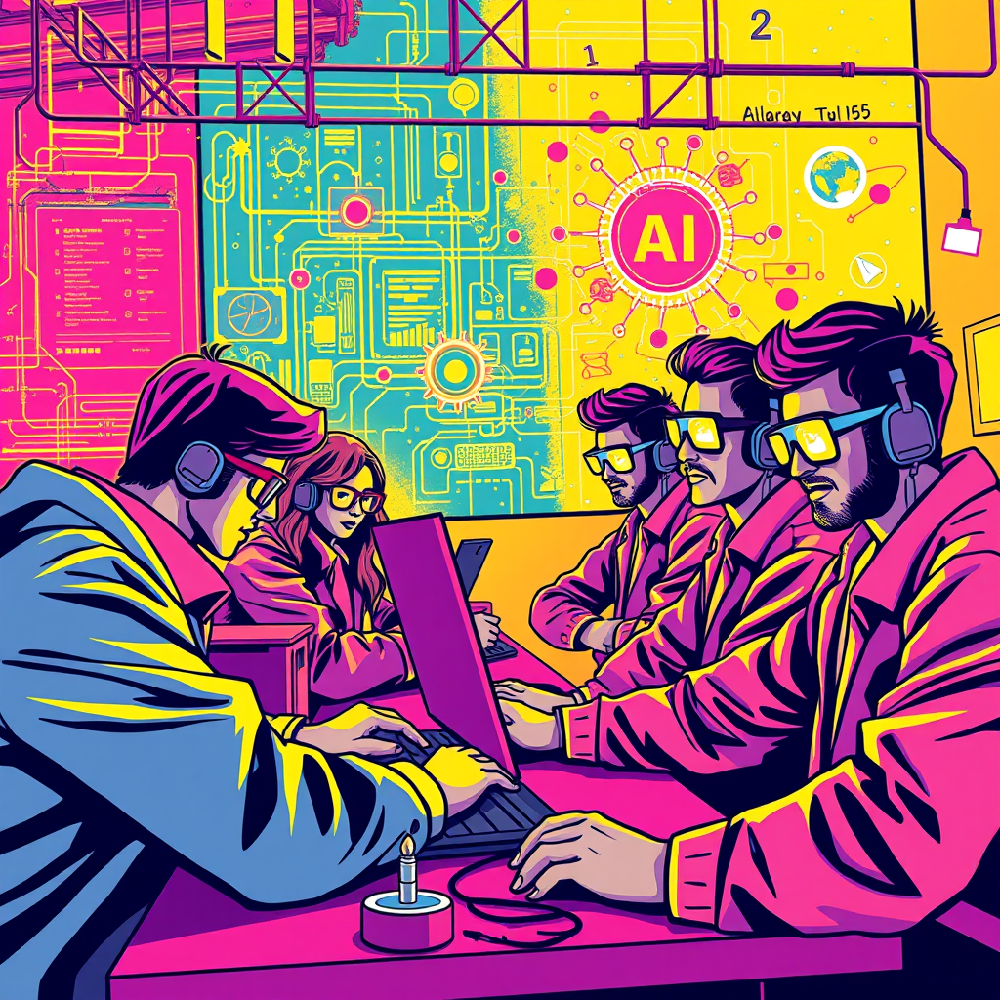

In [4]:
import torch
from diffusers import FluxPipeline
from IPython.display import display
from datetime import datetime

start = datetime.now()

pipe = FluxPipeline.from_pretrained("black-forest-labs/FLUX.1-schnell", torch_dtype=torch.bfloat16).to("cuda")
generator = torch.Generator(device="cuda").manual_seed(0)
prompt = "A class of data scientists learning AI engineering in a vibrant high-energy pop-art style"

# Generate the image using the GPU
image = pipe(
    prompt,
    guidance_scale=0.0,
    num_inference_steps=4,
    max_sequence_length=256,
    generator=generator
).images[0]

display(image)

stop = datetime.now()


In [5]:
# Performance timing

seconds = (stop-start).total_seconds()
print(f"This took {seconds:.1f} seconds to generate")

# Note: Running locally means you're using your own compute resources
# No cloud costs, but make sure your GPU has sufficient VRAM!

This took 272.5 seconds to generate


In [2]:
# prompt = "Chinese lady in a red bikini"
# pipe = FluxPipeline.from_pretrained(
#     "black-forest-labs/FLUX.1-schnell",
#     torch_dtype=torch.bfloat16
# ).to("cuda")

# # timing just the generation:
# start = datetime.now()
# image = pipe(
#     prompt,
#     guidance_scale=0.0,
#     num_inference_steps=4,
#     max_sequence_length=256,
#     generator=generator
# ).images[0]
# stop = datetime.now()
# print("Generation time:", stop - start)


In [ ]:
# Optional: Restart the kernel if needed to free up memory
# Uncomment the lines below if you need to restart the kernel
# import IPython
# IPython.Application.instance().kernel.do_shutdown(True)

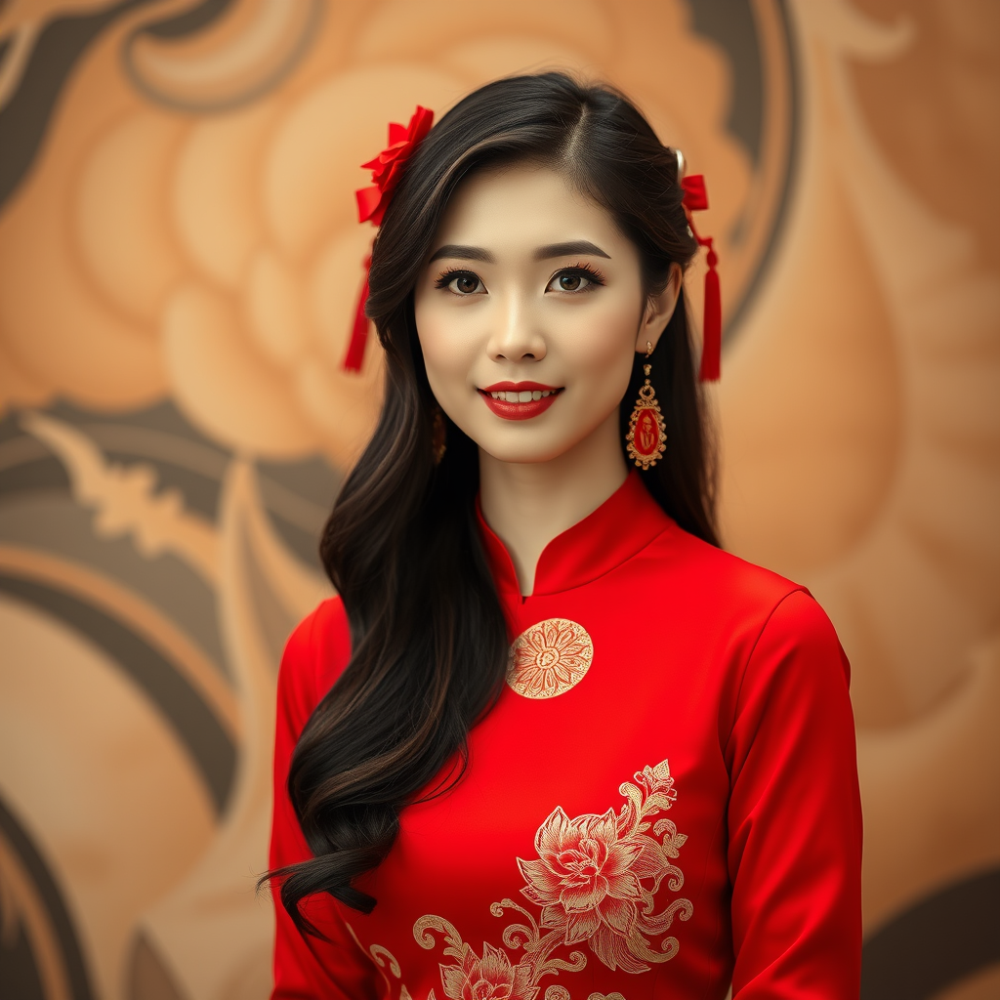

In [ ]:
display(image)

In [ ]:
import torch
from diffusers import FluxPipeline
from IPython.display import display
from datetime import datetime

pipe = FluxPipeline.from_pretrained(
    "black-forest-labs/FLUX.1-schnell",
    torch_dtype=torch.bfloat16
).to("cuda")

generator = torch.Generator(device="cuda").manual_seed(0)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!
You set `add_prefix_space`. The tokenizer needs to be converted from the slow tokenizers


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

In [7]:
prompt = "Japanese lady in a red kimono"

# # timing just the generation:
start = datetime.now()
image = pipe(
    prompt,
    guidance_scale=0.0,
    num_inference_steps=4,
    max_sequence_length=256,
    generator=generator
).images[0]
stop = datetime.now()
print("Generation time:", stop - start)

  0%|          | 0/4 [00:00<?, ?it/s]

Generation time: 0:00:03.025639


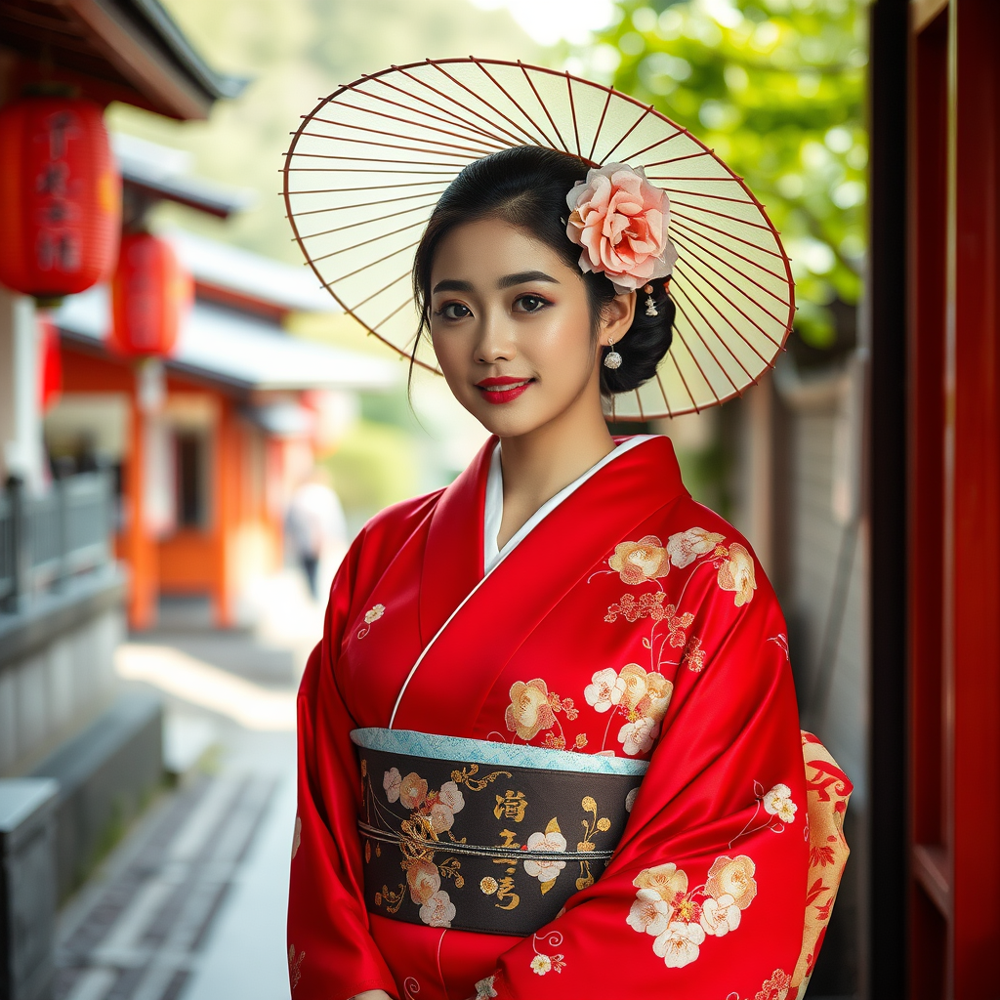

In [8]:
display(image)

In [ ]:
# Optional: Restart the kernel if needed to free up memory
# Uncomment the lines below if you need to restart the kernel
# import IPython
# IPython.Application.instance().kernel.do_shutdown(True)

In [1]:
import gc, torch

# if you created earlier pipelines:
for obj in ["pipe", "pipe2", "flux_pipe"]:
    if obj in globals():
        del globals()[obj]

gc.collect()
torch.cuda.empty_cache()


In [2]:
print("CUDA available:", torch.cuda.is_available())
print("Device:", torch.cuda.get_device_name(0))

free, total = torch.cuda.mem_get_info()
print(f"Free: {free/1024**3:.2f} GB, Total: {total/1024**3:.2f} GB")


CUDA available: True
Device: NVIDIA RTX PRO 6000 Blackwell Workstation Edition
Free: 94.41 GB, Total: 94.97 GB


In [3]:
import torch
from diffusers import Flux2Pipeline
from diffusers.utils import load_image

repo_id = "black-forest-labs/FLUX.2-dev"
device = "cuda:0"
torch_dtype = torch.bfloat16

pipe = Flux2Pipeline.from_pretrained(
    repo_id, torch_dtype=torch_dtype
) 
# \ .to(device)
pipe.enable_model_cpu_offload() #no need to do cpu offload for >80G VRAM carts like H200, B200, etc. and do a `pipe.to(device)` instead


Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


Loading checkpoint shards:   0%|          | 0/10 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/7 [00:00<?, ?it/s]

In [4]:
# prompt = """Realistic macro photograph of a hermit crab using a soda can as its shell, partially emerging from the can, captured with sharp detail and natural colors, 
# on a sunlit beach with soft shadows and a shallow depth of field, with blurred ocean waves in the background. The can has the text `BFL Diffusers` on it 
# and it has a color gradient that start with #FF5733 at the top and transitions to #33FF57 at the bottom."""

prompt = "Japanese lady in a red kimono"

#cat_image = load_image("https://huggingface.co/spaces/zerogpu-aoti/FLUX.1-Kontext-Dev-fp8-dynamic/resolve/main/cat.png")
image = pipe(
    prompt=prompt,
    #image=[cat_image] #multi-image input
    generator=torch.Generator(device=device).manual_seed(42),
    num_inference_steps=5,
    guidance_scale=4,
).images[0]

  0%|          | 0/5 [00:00<?, ?it/s]

: 

In [1]:
display(image)

NameError: name 'image' is not defined

In [ ]:
image.save("flux2_output.png")